In [1]:
pip list

Package                           Version
--------------------------------- ------------------
aiobotocore                       2.12.3
aiohttp                           3.9.5
aioitertools                      0.7.1
aiosignal                         1.2.0
alabaster                         0.7.16
altair                            5.0.1
anaconda-anon-usage               0.4.4
anaconda-catalogs                 0.2.0
anaconda-client                   1.12.3
anaconda-cloud-auth               0.5.1
anaconda-navigator                2.6.0
anaconda-project                  0.11.1
annotated-types                   0.6.0
anyio                             4.2.0
appdirs                           1.4.4
archspec                          0.2.3
argon2-cffi                       21.3.0
argon2-cffi-bindings              21.2.0
arrow                             1.2.3
astroid                           2.14.2
astropy                           6.1.0
astropy-iers-data                 0.2024.6.3.0.31.14
astto

In [2]:
%pip install rtree
%pip install open3d


Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install trimesh

Note: you may need to restart the kernel to use updated packages.


In [4]:
%pip install open3d

Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install networkx

Note: you may need to restart the kernel to use updated packages.


In [6]:
pip install trimesh open3d networkx numpy matplotlib

Note: you may need to restart the kernel to use updated packages.


In [7]:
import trimesh
import numpy as np
import open3d as o3d
import plotly.graph_objects as go
import networkx as nx
import math
import matplotlib.pyplot as plt

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


Existing floors in the model: 40
Total floors for new analysis: 42
Number of rectangles detected: 8
Floors per rectangle: 5
Calculated Floor Levels: [0.0, 1.2, 2.4, 3.5999999999999996, 4.8, 6.0]
Number of floor groups in new mesh: 24
Number of wall groups in new mesh: 78


Base geometry has 345 vertices and 432 faces.
Final geometry has 665 vertices and 752 faces.
Final model (including all floors) exported to ..\Reference Files\Final_Model.obj
Added floors model exported to ..\Reference Files\Added_Floors2.obj
Bottom surface has 32 outer boundary edges.
Boundary vertices and edges saved as CSV files.
Found and split into 64 distinct edges.
Boundary vertices and edges saved as CSV files.
Detected Rectangles from CSV Boundary Data:
Empty DataFrame
Columns: []
Index: []


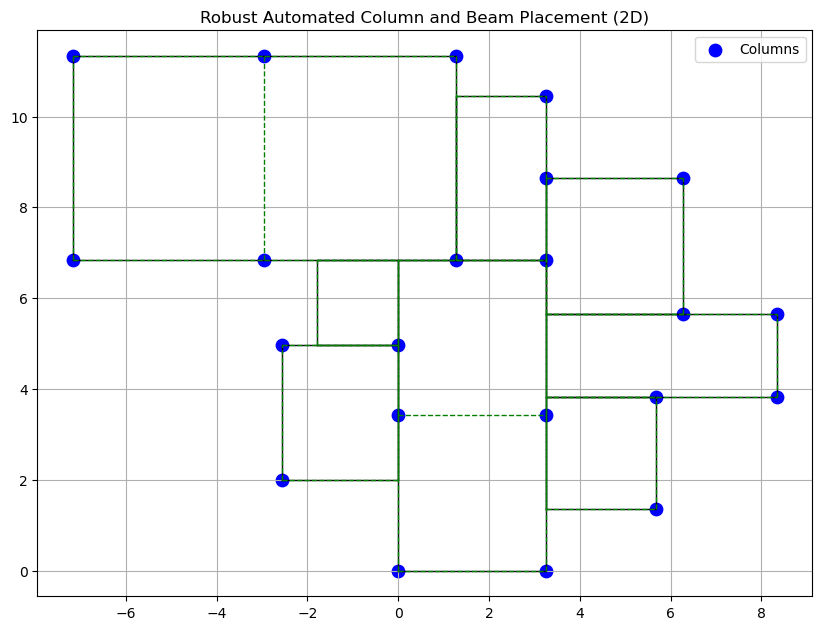

Structural grid data exported to structural_grid.pkl


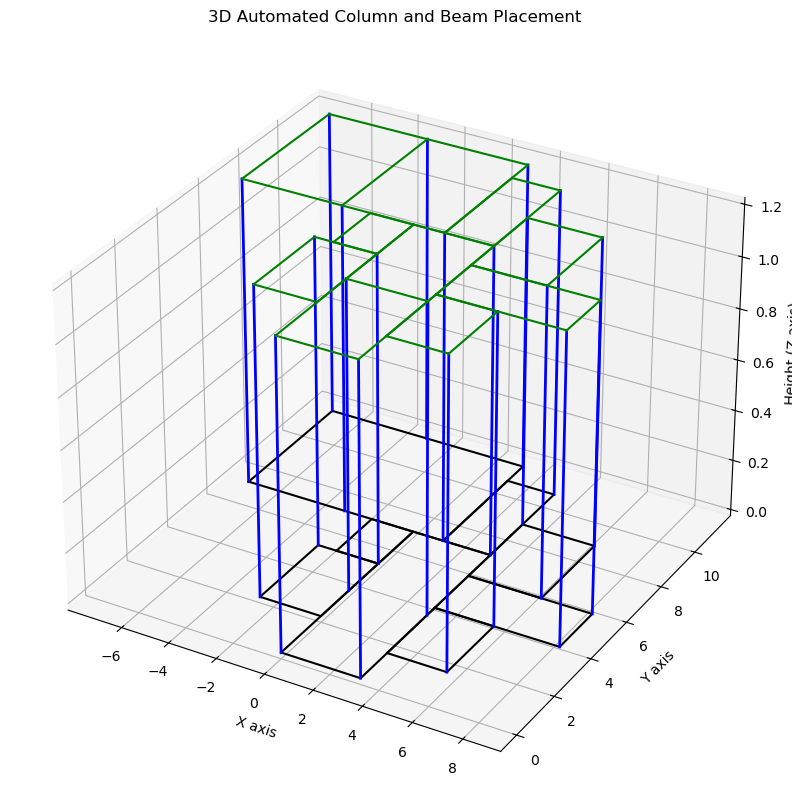

Detected ground columns:
Column 1: Center = POINT (-4.33606920403727 11.25087484833987), Diameter ≈ 0.200 m, Circularity = 1.00
Column 2: Center = POINT (-4.33606920403782 6.943056680386698), Diameter ≈ 0.200 m, Circularity = 1.00


In [16]:
import sys
import subprocess

def install_packages():
    """
    Install required packages if they are not already installed.
    """
    try:
        import pkg_resources
    except ImportError:
        subprocess.check_call([sys.executable, "-m", "pip", "install", "setuptools"])
        import pkg_resources

    required = {"rtree", "open3d", "networkx", "trimesh", "numpy", "matplotlib", "plotly", "shapely", "pandas"}
    installed = {pkg.key for pkg in pkg_resources.working_set}
    missing = required - installed
    if missing:
        print("Installing missing packages:", missing)
        subprocess.check_call([sys.executable, "-m", "pip", "install", *missing])

install_packages()

# ----------------------------
# Unified Imports
# ----------------------------
import numpy as np
import trimesh
import open3d as o3d
import networkx as nx
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import pandas as pd
from shapely.geometry import LineString, Point, Polygon, MultiPolygon
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401
from itertools import combinations
import pickle

# ----------------------------
# 1. Load the OBJ Model using a File Dialog
# ----------------------------
from tkinter import Tk
from tkinter.filedialog import askopenfilename

# Hide the root window so only the file dialog appears
root = Tk()
root.withdraw()

# Open a file dialog to select the OBJ file
obj_path = askopenfilename(title="Select OBJ File", filetypes=[("OBJ Files", "*.obj")])
if not obj_path:
    print("No file selected. Exiting.")
    sys.exit()

mesh = trimesh.load(obj_path)
vertices = mesh.vertices
faces = np.array(mesh.faces)  # Ensure faces is a NumPy array

# ----------------------------
# 2. Calculate Existing Floors
# ----------------------------
def is_floor(face_normal, normal_threshold=0.1):
    """Determine if a face is horizontal enough to be considered a floor."""
    return abs(face_normal[2]) > (1 - normal_threshold)

def group_connected_faces(face_indices, normals, mesh_object, similarity_threshold=0.05):
    """
    Group face indices based on connectivity and similar normals.
    Uses mesh_object.face_adjacency for connectivity.
    """
    groups = []
    visited = set()
    for face_index in face_indices:
        if face_index in visited:
            continue
        group = {face_index}
        queue = [face_index]
        visited.add(face_index)
        while queue:
            current = queue.pop(0)
            # Gather neighbors from face_adjacency
            neighbors = set()
            for pair in mesh_object.face_adjacency:
                if current in pair:
                    neighbors.update(pair)
            neighbors.discard(current)
            for neighbor in neighbors:
                if neighbor in visited:
                    continue
                # Compare normals using dot product
                if np.dot(normals[current], normals[neighbor]) > similarity_threshold:
                    group.add(neighbor)
                    queue.append(neighbor)
                    visited.add(neighbor)
        groups.append(list(group))
    return groups

all_face_indices = set(range(len(faces)))
existing_floor_face_indices = [i for i in all_face_indices if is_floor(mesh.face_normals[i])]
existing_floor_groups = group_connected_faces(existing_floor_face_indices, mesh.face_normals, mesh)
existing_floors_count = len(existing_floor_groups)
print("Existing floors in the model:", existing_floors_count)

# ----------------------------
# 3. Combine Existing Floors with User Input
# ----------------------------
additional_floors = int(input("Enter the additional number of floors to add: "))
total_floors = existing_floors_count + additional_floors
print("Total floors for new analysis:", total_floors)

# ----------------------------
# 4. Robust Rectangle Detection using Aligned Vertex Groups (2D)
#    (This version uses the 2D projection of the mesh vertices.)
# ----------------------------
tolerance = 1e-2  # Tolerance for robust detection

def group_aligned(coords, tol):
    groups = []
    sorted_coords = sorted(coords)
    current_group = [sorted_coords[0]]
    for coord in sorted_coords[1:]:
        if abs(coord - current_group[-1]) < tol:
            current_group.append(coord)
        else:
            groups.append(np.mean(current_group))
            current_group = [coord]
    groups.append(np.mean(current_group))
    return groups

# Use the 2D projection of the original vertices
vertices_boundary = vertices[:, :2]
x_groups = group_aligned(vertices_boundary[:, 0], tolerance)
y_groups = group_aligned(vertices_boundary[:, 1], tolerance)

def vertex_exists(x, y, vertices, tol):
    return np.any((np.abs(vertices[:,0] - x) < tol) & (np.abs(vertices[:,1] - y) < tol))

# Explicitly find rectangles by aligned vertex groups
rectangles_aligned = []
for x1, x2 in combinations(x_groups, 2):
    for y1, y2 in combinations(y_groups, 2):
        corners = [(x1, y1), (x2, y1), (x2, y2), (x1, y2)]
        if all(vertex_exists(x, y, vertices_boundary, tolerance) for x, y in corners):
            poly = Polygon(corners)
            rectangles_aligned.append((poly, poly.area))

# Sort rectangles by area and remove enclosed ones
rectangles_aligned.sort(key=lambda x: -x[1])
final_rectangles_aligned = []
for rect, area in rectangles_aligned:
    enclosed = False
    for bigger_rect, _ in final_rectangles_aligned:
        if bigger_rect.contains(rect):
            enclosed = True
            break
    if not enclosed:
        final_rectangles_aligned.append((rect, area))

# Define NUM_RECTANGLES from the detected rectangles
NUM_RECTANGLES = len(final_rectangles_aligned)
print(f"Number of rectangles detected: {NUM_RECTANGLES}")

# ----------------------------
# 5. Compute Floors Per Rectangle and Divide the Model Vertically
# ----------------------------
# Compute the number of floors per rectangle (using integer division)
floors_per_rectangle = total_floors // NUM_RECTANGLES
print("Floors per rectangle:", floors_per_rectangle)

def divide_into_floors(vertices, num_floors):
    """Compute equally spaced floor levels along Z using the model's bounding box."""
    min_z = np.min(vertices[:, 2])
    max_z = np.max(vertices[:, 2])
    floor_height = (max_z - min_z) / num_floors
    floor_levels = [min_z + i * floor_height for i in range(num_floors + 1)]
    return floor_levels

floor_levels = divide_into_floors(vertices, floors_per_rectangle)
print("Calculated Floor Levels:", floor_levels)

# ----------------------------
# 6. Detect Floors and Walls in the Mesh (Slicing)
# ----------------------------
def create_sliced_mesh(vertices, faces, floor_levels, original_mesh, normal_threshold=0.1):
    """
    Classify each face as floor (if horizontal) or wall (if vertical) based on its centroid's Z.
    Returns lists of face indices for floors and walls.
    """
    floor_face_indices = []
    wall_face_indices = []
    for i, face in enumerate(faces):
        pts = vertices[face]
        centroid = pts.mean(axis=0)
        face_normal = original_mesh.face_normals[i]
        assigned = False
        if is_floor(face_normal, normal_threshold):
            # Assign to a floor slice based on the centroid
            for j in range(len(floor_levels) - 1):
                if floor_levels[j] <= centroid[2] < floor_levels[j+1]:
                    floor_face_indices.append(i)
                    assigned = True
                    break
        # If not a floor and clearly vertical, assign as wall.
        if not assigned and (abs(face_normal[2]) < normal_threshold):
            wall_face_indices.append(i)
    return floor_face_indices, wall_face_indices

floor_face_indices_new, wall_face_indices_new = create_sliced_mesh(vertices, faces, floor_levels, mesh)

# Create new trimesh objects from the selected faces.
if len(floor_face_indices_new) > 0:
    floor_mesh_new = trimesh.Trimesh(vertices=vertices, faces=faces[floor_face_indices_new], process=True)
else:
    floor_mesh_new = None

if len(wall_face_indices_new) > 0:
    wall_mesh_new = trimesh.Trimesh(vertices=vertices, faces=faces[wall_face_indices_new], process=True)
else:
    wall_mesh_new = None

# ----------------------------
# 7. Group Connected Faces on the New Meshes
# ----------------------------
if floor_mesh_new is not None:
    floor_normals_new = floor_mesh_new.face_normals
    floor_face_ids = list(range(len(floor_mesh_new.faces)))
    floor_groups_new = group_connected_faces(floor_face_ids, floor_normals_new, floor_mesh_new)
else:
    floor_groups_new = []

if wall_mesh_new is not None:
    wall_normals_new = wall_mesh_new.face_normals
    wall_face_ids = list(range(len(wall_mesh_new.faces)))
    wall_groups_new = group_connected_faces(wall_face_ids, wall_normals_new, wall_mesh_new)
else:
    wall_groups_new = []

num_floors_new = len(floor_groups_new)
num_walls_new = len(wall_groups_new)
print(f"Number of floor groups in new mesh: {num_floors_new}")
print(f"Number of wall groups in new mesh: {num_walls_new}")

# ----------------------------
# 8. Visualization Using Plotly (Floors)
# ----------------------------
def visualize_floors(vertices, faces, floor_levels):
    """
    Visualize the base model and semi-transparent horizontal surfaces for each calculated floor level.
    """
    fig = go.Figure()
    # Base model mesh (low opacity)
    fig.add_trace(go.Mesh3d(x=vertices[:, 0],
                            y=vertices[:, 1],
                            z=vertices[:, 2],
                            i=faces[:, 0],
                            j=faces[:, 1],
                            k=faces[:, 2],
                            opacity=0.1,
                            color='red'))
    # Create horizontal grid surfaces for each floor level
    x_min, x_max = np.min(vertices[:, 0]), np.max(vertices[:, 0])
    y_min, y_max = np.min(vertices[:, 1]), np.max(vertices[:, 1])
    for i in range(len(floor_levels) - 1):
        z_level = floor_levels[i]
        x = np.linspace(x_min, x_max, 250)
        y = np.linspace(y_min, y_max, 250)
        X, Y = np.meshgrid(x, y)
        Z = np.full_like(X, z_level)
        # Here we use trimesh's contains method
        points = np.stack([X.flatten(), Y.flatten(), Z.flatten()], axis=-1)
        inside = mesh.contains(points)
        inside_grid = inside.reshape(X.shape)
        X_masked = np.where(inside_grid, X, np.nan)
        Y_masked = np.where(inside_grid, Y, np.nan)
        Z_masked = np.where(inside_grid, Z, np.nan)
        fig.add_trace(go.Surface(x=X_masked, y=Y_masked, z=Z_masked,
                                 opacity=0.5, colorscale=[[0, 'blue'], [1, 'blue']]))
    fig.update_layout(scene=dict(aspectmode='data'))
    fig.show()

visualize_floors(vertices, faces, floor_levels)

# ----------------------------
# 9. Assemble Base Geometry (Processed Floors and Walls)
# ----------------------------
geometries_list = []
if floor_mesh_new is not None:
    geometries_list.append(floor_mesh_new)
if wall_mesh_new is not None:
    geometries_list.append(wall_mesh_new)
if geometries_list:
    base_geometry = trimesh.util.concatenate(geometries_list)
    print("Base geometry has {} vertices and {} faces.".format(len(base_geometry.vertices), len(base_geometry.faces)))
else:
    base_geometry = None
    print("No base geometry created.")

# ----------------------------
# 10. Create Additional Floors (if needed)
# ----------------------------
added_floors_list = []
if additional_floors > 0 and floor_mesh_new is not None:
    # Compute floor height from the original bounding box and total floors
    floor_height = (np.max(vertices[:, 2]) - np.min(vertices[:, 2])) / total_floors
    for i in range(additional_floors):
        new_floor_vertices = np.copy(floor_mesh_new.vertices)
        new_floor_vertices[:, 2] += (i + 1) * floor_height
        new_floors_mesh = trimesh.Trimesh(vertices=new_floor_vertices, faces=floor_mesh_new.faces)
        added_floors_list.append(new_floors_mesh)

# ----------------------------
# 11. Combine Base Geometry and Additional Floors for Final Export
# ----------------------------
all_geometries = []
if base_geometry is not None:
    all_geometries.append(base_geometry)
if added_floors_list:
    all_geometries.extend(added_floors_list)
if all_geometries:
    final_geometry = trimesh.util.concatenate(all_geometries)
    print("Final geometry has {} vertices and {} faces.".format(len(final_geometry.vertices), len(final_geometry.faces)))
else:
    final_geometry = None
    print("No final geometry created.")

# Export full geometry (base + added floors)
if final_geometry is not None:
    export_path_full = r"..\Reference Files\Final_Model.obj"  # Define the export path
    final_geometry.export(export_path_full)
    print(f"Final model (including all floors) exported to {export_path_full}")
# Export only added floors (if any)
if added_floors_list:
    added_floors_geometry = trimesh.util.concatenate(added_floors_list)
    export_path_added = r"..\Reference Files\Added_Floors2.obj"
    added_floors_geometry.export(export_path_added)
    print(f"Added floors model exported to {export_path_added}")

# ----------------------------
# 12. Bottom Surface Extraction & Visualization (Open3D, networkx)
# ----------------------------
if final_geometry is not None:
    vertices_final = final_geometry.vertices
    bottom_z = vertices_final[:, 2].min()
    tol = 1e-3  # Tolerance for Z comparison
    
    # Identify faces whose centroid is at the bottom.
    bottom_face_indices = []
    for i, face in enumerate(final_geometry.faces):
        centroid = vertices_final[face].mean(axis=0)
        if abs(centroid[2] - bottom_z) < tol:
            bottom_face_indices.append(i)
            
    if not bottom_face_indices:
        print("No bottom surface faces found.")
    else:
        bottom_mesh = trimesh.Trimesh(vertices=vertices_final,
                                      faces=np.array(final_geometry.faces)[bottom_face_indices],
                                      process=True)
        edges_sorted = np.sort(bottom_mesh.edges, axis=1)
        unique_edges, counts = np.unique(edges_sorted, axis=0, return_counts=True)
        boundary_edges = unique_edges[counts == 1]
        
        if len(boundary_edges) == 0:
            print("No boundary edges found on the bottom surface.")
        else:
            G = nx.Graph()
            for edge in boundary_edges:
                G.add_edge(edge[0], edge[1])
            components = list(nx.connected_components(G))
            largest_component = max(components, key=len)
            outer_edges = [edge for edge in boundary_edges 
                           if edge[0] in largest_component and edge[1] in largest_component]
            outer_edges = np.array(outer_edges)
            print(f"Bottom surface has {len(outer_edges)} outer boundary edges.")
            
            # Create an Open3D LineSet.
            line_set = o3d.geometry.LineSet()
            line_set.points = o3d.utility.Vector3dVector(bottom_mesh.vertices)
            line_set.lines = o3d.utility.Vector2iVector(outer_edges)
            
            # Assign each edge a unique color using a colormap.
            n_edges = len(outer_edges)
            cmap = plt.get_cmap("jet")
            colors = np.array([cmap(i / n_edges)[:3] for i in range(n_edges)])
            line_set.colors = o3d.utility.Vector3dVector(colors)
            
            o3d.visualization.draw_geometries([line_set])
            
            # Save the vertices and edges as CSV.
            np.savetxt("boundary_vertices.csv", np.array(bottom_mesh.vertices), delimiter=",")
            np.savetxt("boundary_edges.csv", outer_edges, delimiter=",", fmt="%d")
            print("Boundary vertices and edges saved as CSV files.")
else:
    print("Final geometry is None; nothing to process for bottom surface visualization.")

# ----------------------------
# 13. Robust Edge Splitting at Intersections
# ----------------------------
def split_edges_at_intersections(vertices, edges):
    lines = [LineString([vertices[e[0]], vertices[e[1]]]) for e in edges]
    new_vertices = vertices.tolist()
    new_edges = []

    for i, line in enumerate(lines):
        for j, other_line in enumerate(lines):
            if i != j:
                if line.crosses(other_line):
                    intersection = line.intersection(other_line)
                    if intersection.geom_type == 'Point':
                        pt = list(intersection.coords[0])
                        if not any(np.allclose(pt, v, atol=1e-8) for v in new_vertices):
                            new_vertices.append(pt)

        points_on_line = [line.coords[0], line.coords[1]] + [v for v in new_vertices if line.distance(Point(v)) < 1e-8]
        points_on_line.sort(key=lambda pt: line.project(Point(pt)))

        for k in range(len(points_on_line) - 1):
            start_pt, end_pt = points_on_line[k], points_on_line[k + 1]
            start_idx = next(idx for idx, v in enumerate(new_vertices) if np.allclose(v, start_pt, atol=1e-8))
            end_idx = next(idx for idx, v in enumerate(new_vertices) if np.allclose(v, end_pt, atol=1e-8))
            if start_idx != end_idx:
                new_edges.append([start_idx, end_idx])

    return np.array(new_edges), np.array(new_vertices)

if final_geometry is not None:
    vertices_final = final_geometry.vertices
    bottom_z = vertices_final[:, 2].min()
    tol = 1e-3

    bottom_face_indices = [
        i for i, face in enumerate(final_geometry.faces)
        if abs(vertices_final[face].mean(axis=0)[2] - bottom_z) < tol
    ]

    if bottom_face_indices:
        bottom_mesh = trimesh.Trimesh(vertices=vertices_final,
                                      faces=np.array(final_geometry.faces)[bottom_face_indices],
                                      process=True)
        edges_sorted = np.sort(bottom_mesh.edges, axis=1)
        unique_edges, counts = np.unique(edges_sorted, axis=0, return_counts=True)
        boundary_edges = unique_edges[counts == 1]

        split_edges, updated_vertices = split_edges_at_intersections(bottom_mesh.vertices, boundary_edges)

        print(f"Found and split into {len(split_edges)} distinct edges.")

        line_set = o3d.geometry.LineSet()
        line_set.points = o3d.utility.Vector3dVector(updated_vertices)
        line_set.lines = o3d.utility.Vector2iVector(split_edges)

        colors = plt.cm.jet(np.linspace(0, 1, len(split_edges)))[:, :3]
        line_set.colors = o3d.utility.Vector3dVector(colors)

        o3d.visualization.draw_geometries([line_set])

        np.savetxt("boundary_vertices.csv", updated_vertices, delimiter=",")
        np.savetxt("boundary_edges.csv", split_edges, delimiter=",", fmt="%d")
        print("Boundary vertices and edges saved as CSV files.")
    else:
        print("No bottom surface faces found.")
else:
    print("Final geometry is None; nothing to process for bottom surface visualization.")

# ----------------------------
# 14. Robust Rectangle Detection from CSV Boundary Data (2D)
# ----------------------------
try:
    vertices_boundary_csv = np.loadtxt("boundary_vertices.csv", delimiter=",")
    edges_boundary_csv = np.loadtxt("boundary_edges.csv", delimiter=",", dtype=int)

    # Create a graph from edges
    G = nx.Graph()
    G.add_edges_from(edges_boundary_csv)

    def is_rectangle(poly_coords, tol=1e-3):
        if len(poly_coords) != 4:
            return False
        poly = Polygon(poly_coords)
        if not poly.is_valid or not poly.is_simple:
            return False
        angles = []
        for i in range(4):
            p1, p2, p3 = poly_coords[i], poly_coords[(i+1)%4], poly_coords[(i+2)%4]
            v1 = np.array(p1) - np.array(p2)
            v2 = np.array(p3) - np.array(p2)
            angle = np.arccos(np.clip(np.dot(v1, v2)/(np.linalg.norm(v1)*np.linalg.norm(v2)), -1.0, 1.0))
            angles.append(angle)
        angles = np.array(angles)
        return np.all(np.abs(angles - np.pi/2) < tol)

    cycles = nx.simple_cycles(nx.DiGraph(G))
    cycles = [cycle for cycle in cycles if len(cycle) == 4]

    rectangles = []
    for cycle in cycles:
        poly_coords = vertices_boundary_csv[cycle, :2]
        if is_rectangle(poly_coords):
            poly = Polygon(poly_coords)
            rectangles.append((poly, poly.area))

    rectangles.sort(key=lambda x: -x[1])
    final_rectangles = []
    for rect, area in rectangles:
        enclosed = False
        for bigger_rect, _ in final_rectangles:
            if bigger_rect.contains(rect):
                enclosed = True
                break
        if not enclosed:
            final_rectangles.append((rect, area))

    df_rectangles = pd.DataFrame([{
        'Rectangle_ID': idx,
        'Area': area,
        'Coordinates': np.array(rect.exterior.coords).tolist()
    } for idx, (rect, area) in enumerate(final_rectangles)])
    print("Detected Rectangles from CSV Boundary Data:")
    print(df_rectangles)
except Exception as e:
    print("Could not load or process CSV boundary data:", e)

# ----------------------------
# 15. Robust Automated Column and Beam Placement (2D Visualization)
# ----------------------------
MaxS = 6.0  # Maximum allowed span
MinS = 3.0  # Minimum allowed span

# Using the rectangles detected earlier (final_rectangles_aligned)
columns = []
beams = []
existing_columns = []

# Sort rectangles by area
detected_rooms = sorted(final_rectangles_aligned, key=lambda x: -x[1])

# Place columns and beams in each room
for room_poly, area in detected_rooms:
    minx, miny, maxx, maxy = room_poly.bounds
    width = maxx - minx
    height = maxy - miny

    divisions_x = int(np.ceil(width / MaxS))
    divisions_y = int(np.ceil(height / MaxS))

    x_points = np.linspace(minx, maxx, divisions_x + 1)
    y_points = np.linspace(miny, maxy, divisions_y + 1)

    room_columns = [(x, y) for x in x_points for y in y_points]

    filtered_columns = []
    for col in room_columns:
        if all(np.linalg.norm(np.array(col) - np.array(exist_col)) >= MinS for exist_col in existing_columns):
            filtered_columns.append(col)

    for x in x_points:
        beams.append(((x, miny), (x, maxy)))
    for y in y_points:
        beams.append(((minx, y), (maxx, y)))

    columns.extend(filtered_columns)
    existing_columns.extend(filtered_columns)

# Ensure perimeter columns are placed
for poly, _ in detected_rooms:
    for corner in list(poly.exterior.coords):
        if all(np.linalg.norm(np.array(corner) - np.array(existing_col)) >= MinS * 0.5 for existing_col in existing_columns):
            columns.append(corner)
            existing_columns.append(corner)

# 2D Visualization of Columns and Beams
fig, ax = plt.subplots(figsize=(10, 10))
for poly, _ in detected_rooms:
    x, y = poly.exterior.xy
    ax.plot(x, y, 'k-', linewidth=1)
if columns:
    col_x, col_y = zip(*columns)
    ax.scatter(col_x, col_y, c='blue', s=80, label='Columns')
for beam in beams:
    (x1, y1), (x2, y2) = beam
    ax.plot([x1, x2], [y1, y2], 'green', linestyle='--', linewidth=1)
ax.set_aspect('equal', 'box')
ax.legend()
plt.title("Robust Automated Column and Beam Placement (2D)")
plt.grid(True)
plt.show()

# ----------------------------
# 16. Multi-Floor Column and Beam Grid Generation and Visualization (3D)
# ----------------------------
def generate_structural_grid(detected_rooms, floor_levels, MaxS=4.0, MinS=2.0):
    """Generate columns and beams for each floor level"""
    columns_3d = []
    beams_3d = []
    existing_columns_2d = []  # Track column positions in 2D for spacing

    # Generate column positions in 2D
    for room_poly, area in detected_rooms:
        minx, miny, maxx, maxy = room_poly.bounds
        width = maxx - minx
        height = maxy - miny

        divisions_x = int(np.ceil(width / MaxS))
        divisions_y = int(np.ceil(height / MaxS))

        x_points = np.linspace(minx, maxx, divisions_x + 1)
        y_points = np.linspace(miny, maxy, divisions_y + 1)

        for x in x_points:
            for y in y_points:
                if all(np.linalg.norm(np.array([x, y]) - np.array(exist_col)) >= MinS 
                       for exist_col in existing_columns_2d):
                    existing_columns_2d.append((x, y))
                    
        for corner in list(room_poly.exterior.coords):
            if all(np.linalg.norm(np.array(corner) - np.array(exist_col)) >= MinS * 0.5 
                   for exist_col in existing_columns_2d):
                existing_columns_2d.append(corner)

    # Generate 3D elements for each floor
    for i in range(len(floor_levels) - 1):
        floor_bottom = floor_levels[i]
        floor_top = floor_levels[i + 1]
        
        for x, y in existing_columns_2d:
            columns_3d.append(((x, y, floor_bottom), (x, y, floor_top)))
        
        for room_poly, area in detected_rooms:
            minx, miny, maxx, maxy = room_poly.bounds
            width = maxx - minx
            height = maxy - miny

            divisions_x = int(np.ceil(width / MaxS))
            divisions_y = int(np.ceil(height / MaxS))

            x_points = np.linspace(minx, maxx, divisions_x + 1)
            y_points = np.linspace(miny, maxy, divisions_y + 1)

            for y in y_points:
                for j in range(len(x_points) - 1):
                    beams_3d.append(((x_points[j], y, floor_top), 
                                     (x_points[j+1], y, floor_top)))
            for x in x_points:
                for j in range(len(y_points) - 1):
                    beams_3d.append(((x, y_points[j], floor_top), 
                                     (x, y_points[j+1], floor_top)))
    return columns_3d, beams_3d

def visualize_structural_grid_3d(detected_rooms, columns_3d, beams_3d, floor_levels):
    """Visualize the multi-floor structural grid using Open3D"""
    vis = o3d.visualization.Visualizer()
    vis.create_window(window_name="Multi-Floor Structural Grid", width=1920, height=1080)
    
    geometries = []
    for col_start, col_end in columns_3d:
        line = o3d.geometry.LineSet()
        points = np.array([col_start, col_end])
        lines = np.array([[0, 1]])
        line.points = o3d.utility.Vector3dVector(points)
        line.lines = o3d.utility.Vector2iVector(lines)
        line.colors = o3d.utility.Vector3dVector([[0.8, 0.4, 0.2]])  # Orange columns
        geometries.append(line)
    
    for beam_start, beam_end in beams_3d:
        line = o3d.geometry.LineSet()
        points = np.array([beam_start, beam_end])
        lines = np.array([[0, 1]])
        line.points = o3d.utility.Vector3dVector(points)
        line.lines = o3d.utility.Vector2iVector(lines)
        line.colors = o3d.utility.Vector3dVector([[0.2, 0.6, 0.3]])  # Green beams
        geometries.append(line)
    
    for z in floor_levels:
        for poly, _ in detected_rooms:
            coords = np.array(poly.exterior.coords)
            points = np.column_stack((coords, np.full(len(coords), z)))
            line = o3d.geometry.LineSet()
            line.points = o3d.utility.Vector3dVector(points)
            lines = np.array([[i, i+1] for i in range(len(points)-1)])
            line.lines = o3d.utility.Vector2iVector(lines)
            line.colors = o3d.utility.Vector3dVector([[0.5, 0.5, 0.5]] * len(lines))
            geometries.append(line)
    
    for geom in geometries:
        vis.add_geometry(geom)
    
    opt = vis.get_render_option()
    opt.background_color = np.array([0.1, 0.1, 0.1])
    opt.point_size = 6
    opt.line_width = 4
    
    vis.run()
    vis.destroy_window()

if detected_rooms and floor_levels:
    columns_3d, beams_3d = generate_structural_grid(detected_rooms, floor_levels)
    visualize_structural_grid_3d(detected_rooms, columns_3d, beams_3d, floor_levels)
    
    structural_data = {
        'columns': columns_3d,
        'beams': beams_3d,
        'floor_levels': floor_levels
    }
    
    with open('structural_grid.pkl', 'wb') as f:
        pickle.dump(structural_data, f)
    print("Structural grid data exported to structural_grid.pkl")
else:
    print("Detected rooms or floor levels not available for structural grid generation.")

# ----------------------------
# 17. 3D Visualization with Columns and Beams at Column Height
# ----------------------------
# Define column_height (for example, use the first floor's height)
column_height = floor_levels[1] if len(floor_levels) > 1 else 3.0

fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')

# Plot base polygons (detected rooms)
for poly, _ in detected_rooms:
    x, y = poly.exterior.xy
    ax.plot(x, y, zs=0, zdir='z', color='black')

# Plot columns as vertical lines
for (x, y) in columns:
    ax.plot([x, x], [y, y], [0, column_height], color='blue', linewidth=2)

# Plot beams at the top (at column_height)
for beam in beams:
    (x1, y1), (x2, y2) = beam
    ax.plot([x1, x2], [y1, y2], zs=column_height, zdir='z', color='green', linewidth=1.5)

ax.set_xlabel('X axis')
ax.set_ylabel('Y axis')
ax.set_zlabel('Height (Z axis)')
ax.set_title("3D Automated Column and Beam Placement")
ax.grid(True)
plt.show()

# ----------------------------
# 18. Detect Ground Columns (Elements near Column Size Touching the Ground)
# ----------------------------
def detect_ground_columns(vertices, column_diameter=0.2, diameter_tolerance=0.05, tolerance_z=0.05, cluster_distance=0.1):
    """
    Detects ground columns by clustering vertices that are near the ground (z close to min_z),
    and checking if the cluster's size approximates a circular column of the given diameter.
    
    Parameters:
        vertices         : The vertices of the model.
        column_diameter  : Expected diameter of a column (in meters).
        diameter_tolerance: Acceptable tolerance for the diameter.
        tolerance_z      : Tolerance in z-direction to consider a vertex as touching the ground.
        cluster_distance : Maximum distance between vertices to be considered part of the same cluster.
        
    Returns:
        A list of tuples: (centroid, measured diameter, circularity)
    """
    # Determine ground level (minimum Z)
    min_z = np.min(vertices[:, 2])
    # Filter vertices that are close to the ground
    ground_indices = np.where(vertices[:, 2] < (min_z + tolerance_z))[0]
    ground_points = vertices[ground_indices, :2]  # Use only X, Y coordinates
    
    # Simple clustering: group points that are within cluster_distance
    clusters = []
    visited = set()
    for i in range(len(ground_points)):
        if i in visited:
            continue
        cluster = [i]
        visited.add(i)
        queue = [i]
        while queue:
            j = queue.pop(0)
            for k in range(len(ground_points)):
                if k not in visited:
                    if np.linalg.norm(ground_points[j] - ground_points[k]) < cluster_distance:
                        cluster.append(k)
                        visited.add(k)
                        queue.append(k)
        clusters.append(cluster)
    
    detected_columns = []
    for cluster in clusters:
        pts = ground_points[cluster]
        if pts.shape[0] < 5:
            continue
        from shapely.geometry import MultiPoint
        mp = MultiPoint(pts)
        hull = mp.convex_hull
        minx, miny, maxx, maxy = hull.bounds
        approx_diameter = max(maxx - minx, maxy - miny)
        if hull.geom_type == 'Polygon':
            area = hull.area
            perimeter = hull.length
            circularity = 4 * np.pi * area / (perimeter**2) if perimeter > 0 else 0
        else:
            circularity = 0
        if abs(approx_diameter - column_diameter) <= diameter_tolerance and circularity > 0.7:
            centroid = np.array(hull.centroid)
            detected_columns.append((centroid, approx_diameter, circularity))
    return detected_columns

detected_columns = detect_ground_columns(vertices, column_diameter=0.2, diameter_tolerance=0.05, tolerance_z=0.05, cluster_distance=0.1)
if detected_columns:
    print("Detected ground columns:")
    for idx, (centroid, diam, circ) in enumerate(detected_columns):
        print(f"Column {idx+1}: Center = {centroid}, Diameter ≈ {diam:.3f} m, Circularity = {circ:.2f}")
else:
    print("No ground columns detected.")


In [ ]:
import sys
import subprocess

def install_packages():
    """
    Install required packages if they are not already installed.
    """
    try:
        import pkg_resources
    except ImportError:
        subprocess.check_call([sys.executable, "-m", "pip", "install", "setuptools"])
        import pkg_resources

    required = {"rtree", "open3d", "networkx", "trimesh", "numpy", "matplotlib", "plotly", "shapely", "pandas"}
    installed = {pkg.key for pkg in pkg_resources.working_set}
    missing = required - installed
    if missing:
        print("Installing missing packages:", missing)
        subprocess.check_call([sys.executable, "-m", "pip", "install", *missing])

install_packages()

# ----------------------------
# Unified Imports
# ----------------------------
import numpy as np
import trimesh
import open3d as o3d
import networkx as nx
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import pandas as pd
from shapely.geometry import LineString, Point, Polygon, MultiPolygon, MultiPoint
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401
from itertools import combinations
import pickle

# ----------------------------
# 1. Load the OBJ Model using a File Dialog
# ----------------------------
from tkinter import Tk
from tkinter.filedialog import askopenfilename

# Hide the root window so only the file dialog appears
root = Tk()
root.withdraw()

# Open a file dialog to select the OBJ file
obj_path = askopenfilename(title="Select OBJ File", filetypes=[("OBJ Files", "*.obj")])
if not obj_path:
    print("No file selected. Exiting.")
    sys.exit()

mesh = trimesh.load(obj_path)
vertices = mesh.vertices
faces = np.array(mesh.faces)  # Ensure faces is a NumPy array

# -----------------------------------------------------------------------------
# Remove all additional floor logic. We define a single floor.
ground_level = np.min(vertices[:, 2])
# Define a default floor height (e.g., 3.0 m).
floor_levels = [ground_level, ground_level + 3.0]
# -----------------------------------------------------------------------------

# ----------------------------
# 4. Robust Rectangle Detection using Aligned Vertex Groups (2D)
# ----------------------------
tolerance = 1e-2  # Tolerance for robust detection

def group_aligned(coords, tol):
    groups = []
    sorted_coords = sorted(coords)
    current_group = [sorted_coords[0]]
    for coord in sorted_coords[1:]:
        if abs(coord - current_group[-1]) < tol:
            current_group.append(coord)
        else:
            groups.append(np.mean(current_group))
            current_group = [coord]
    groups.append(np.mean(current_group))
    return groups

# Use the 2D projection (ignoring Z) of the vertices.
vertices_boundary = vertices[:, :2]
x_groups = group_aligned(vertices_boundary[:, 0], tolerance)
y_groups = group_aligned(vertices_boundary[:, 1], tolerance)

def vertex_exists(x, y, vertices, tol):
    return np.any((np.abs(vertices[:, 0] - x) < tol) & (np.abs(vertices[:, 1] - y) < tol))

# Detect rectangular regions (interpreted as "rooms")
rectangles_aligned = []
for x1, x2 in combinations(x_groups, 2):
    for y1, y2 in combinations(y_groups, 2):
        corners = [(x1, y1), (x2, y1), (x2, y2), (x1, y2)]
        if all(vertex_exists(x, y, vertices_boundary, tolerance) for x, y in corners):
            poly = Polygon(corners)
            rectangles_aligned.append((poly, poly.area))

# Sort and remove enclosed rectangles.
rectangles_aligned.sort(key=lambda x: -x[1])
final_rectangles_aligned = []
for rect, area in rectangles_aligned:
    enclosed = False
    for bigger_rect, _ in final_rectangles_aligned:
        if bigger_rect.contains(rect):
            enclosed = True
            break
    if not enclosed:
        final_rectangles_aligned.append((rect, area))

NUM_RECTANGLES = len(final_rectangles_aligned)
print(f"Number of rectangles detected: {NUM_RECTANGLES}")

# ----------------------------
# 18. Detect Ground Columns (Dominant Columns)
# ----------------------------
def detect_ground_columns(vertices, column_diameter=0.2, diameter_tolerance=0.05, tolerance_z=0.05, cluster_distance=0.1):
    """
    Detects ground columns by clustering vertices near the ground (z close to min_z)
    and checking if the cluster's size approximates a circular column of the given diameter.
    
    Returns a list of tuples: (centroid, measured diameter, circularity)
    """
    min_z = np.min(vertices[:, 2])
    # Filter vertices within tolerance_z above the ground.
    ground_indices = np.where(vertices[:, 2] < (min_z + tolerance_z))[0]
    ground_points = vertices[ground_indices, :2]  # Use only X, Y coordinates
    
    # Simple clustering: group points that are within cluster_distance.
    clusters = []
    visited = set()
    for i in range(len(ground_points)):
        if i in visited:
            continue
        cluster = [i]
        visited.add(i)
        queue = [i]
        while queue:
            j = queue.pop(0)
            for k in range(len(ground_points)):
                if k not in visited:
                    if np.linalg.norm(ground_points[j] - ground_points[k]) < cluster_distance:
                        cluster.append(k)
                        visited.add(k)
                        queue.append(k)
        clusters.append(cluster)
    
    detected_columns = []
    for cluster in clusters:
        pts = ground_points[cluster]
        if pts.shape[0] < 5:
            continue
        mp = MultiPoint(pts)
        hull = mp.convex_hull
        minx, miny, maxx, maxy = hull.bounds
        approx_diameter = max(maxx - minx, maxy - miny)
        if hull.geom_type == 'Polygon':
            area = hull.area
            perimeter = hull.length
            circularity = 4 * np.pi * area / (perimeter**2) if perimeter > 0 else 0
        else:
            circularity = 0
        # Use explicit coordinate extraction for the centroid.
        if abs(approx_diameter - column_diameter) <= diameter_tolerance and circularity > 0.7:
            centroid = (hull.centroid.x, hull.centroid.y)
            detected_columns.append((centroid, approx_diameter, circularity))
    return detected_columns

detected_columns = detect_ground_columns(vertices, column_diameter=0.2, diameter_tolerance=0.05,
                                         tolerance_z=0.05, cluster_distance=0.1)
if detected_columns:
    print("Detected ground columns:")
    for idx, (centroid, diam, circ) in enumerate(detected_columns):
        print(f"Column {idx+1}: Center = {centroid}, Diameter ≈ {diam:.3f} m, Circularity = {circ:.2f}")
else:
    print("No ground columns detected.")

# Prepare the dominant columns list (their XY coordinates) so they are always included.
dominant_columns = [col[0] for col in detected_columns]

# ----------------------------
# 15. Automated Column and Beam Placement (2D Visualization)
# ----------------------------
# Use the detected rectangular regions (rooms) to propose a grid.
MaxS = 6.0  # Maximum allowed span for grid division
MinS = 3.0  # Minimum allowed distance between grid columns

columns = []
beams = []
existing_columns = []

# Sort rooms by area (largest first)
detected_rooms = sorted(final_rectangles_aligned, key=lambda x: -x[1])

for room_poly, area in detected_rooms:
    minx, miny, maxx, maxy = room_poly.bounds
    width = maxx - minx
    height = maxy - miny

    divisions_x = int(np.ceil(width / MaxS))
    divisions_y = int(np.ceil(height / MaxS))

    x_points = np.linspace(minx, maxx, divisions_x + 1)
    y_points = np.linspace(miny, maxy, divisions_y + 1)

    room_columns = [(x, y) for x in x_points for y in y_points]

    filtered_columns = []
    for col in room_columns:
        if all(np.linalg.norm(np.array(col) - np.array(exist_col)) >= MinS for exist_col in existing_columns):
            filtered_columns.append(col)

    for x in x_points:
        beams.append(((x, miny), (x, maxy)))
    for y in y_points:
        beams.append(((minx, y), (maxx, y)))

    columns.extend(filtered_columns)
    existing_columns.extend(filtered_columns)

# Incorporate the dominant (architect-imported) columns so they are preserved.
for dc in dominant_columns:
    if dc not in existing_columns:
        columns.append(dc)
        existing_columns.append(dc)

# 2D Visualization using matplotlib.
fig, ax = plt.subplots(figsize=(10, 10))
for room_poly, _ in detected_rooms:
    x, y = room_poly.exterior.xy
    ax.plot(x, y, 'k-', linewidth=1)
if columns:
    col_x, col_y = zip(*columns)
    ax.scatter(col_x, col_y, c='blue', s=80, label='Columns')
for beam in beams:
    (x1, y1), (x2, y2) = beam
    ax.plot([x1, x2], [y1, y2], 'green', linestyle='--', linewidth=1)
ax.set_aspect('equal', 'box')
ax.legend()
plt.title("Automated Column and Beam Placement (2D)")
plt.grid(True)
plt.show()

# ----------------------------
# 16. Single-Floor Column and Beam Grid Generation and 3D Visualization
# ----------------------------
def generate_structural_grid(detected_rooms, floor_levels, dominant_columns, MaxS=4.0, MinS=2.0):
    """
    Generate 3D column and beam elements for a single floor.
    The dominant (architect-imported) columns are used as a base,
    and additional candidate columns from room division are added if they are sufficiently far apart.
    """
    columns_3d = []
    beams_3d = []
    # Start with dominant columns as the base candidate set.
    existing_columns_2d = list(dominant_columns)

    # Generate additional candidate columns from each room.
    for room_poly, area in detected_rooms:
        minx, miny, maxx, maxy = room_poly.bounds
        width = maxx - minx
        height = maxy - miny

        divisions_x = int(np.ceil(width / MaxS))
        divisions_y = int(np.ceil(height / MaxS))
        x_points = np.linspace(minx, maxx, divisions_x + 1)
        y_points = np.linspace(miny, maxy, divisions_y + 1)
        for x in x_points:
            for y in y_points:
                candidate = (x, y)
                if all(np.linalg.norm(np.array(candidate) - np.array(exist)) >= MinS for exist in existing_columns_2d):
                    existing_columns_2d.append(candidate)
    
    # Generate 3D columns for the single floor.
    floor_bottom = floor_levels[0]
    floor_top = floor_levels[1]
    for x, y in existing_columns_2d:
        columns_3d.append(((x, y, floor_bottom), (x, y, floor_top)))
    
    # Generate beams by creating horizontal and vertical beams within each room.
    for room_poly, area in detected_rooms:
        minx, miny, maxx, maxy = room_poly.bounds
        divisions_x = int(np.ceil((maxx - minx) / MaxS))
        divisions_y = int(np.ceil((maxy - miny) / MaxS))
        x_points = np.linspace(minx, maxx, divisions_x + 1)
        y_points = np.linspace(miny, maxy, divisions_y + 1)
        # Horizontal beams
        for y in y_points:
            for j in range(len(x_points) - 1):
                beams_3d.append(((x_points[j], y, floor_top), (x_points[j+1], y, floor_top)))
        # Vertical beams
        for x in x_points:
            for j in range(len(y_points) - 1):
                beams_3d.append(((x, y_points[j], floor_top), (x, y_points[j+1], floor_top)))
    
    return columns_3d, beams_3d

columns_3d, beams_3d = generate_structural_grid(detected_rooms, floor_levels, dominant_columns)

def visualize_structural_grid_3d(detected_rooms, columns_3d, beams_3d, floor_levels):
    vis = o3d.visualization.Visualizer()
    vis.create_window(window_name="Column and Beam Grid (3D)", width=1920, height=1080)
    
    geometries = []
    for col_start, col_end in columns_3d:
        line = o3d.geometry.LineSet()
        points = np.array([col_start, col_end])
        lines = np.array([[0, 1]])
        line.points = o3d.utility.Vector3dVector(points)
        line.lines = o3d.utility.Vector2iVector(lines)
        line.colors = o3d.utility.Vector3dVector([[0.8, 0.4, 0.2]])  # Orange columns
        geometries.append(line)
    
    for beam_start, beam_end in beams_3d:
        line = o3d.geometry.LineSet()
        points = np.array([beam_start, beam_end])
        lines = np.array([[0, 1]])
        line.points = o3d.utility.Vector3dVector(points)
        line.lines = o3d.utility.Vector2iVector(lines)
        line.colors = o3d.utility.Vector3dVector([[0.2, 0.6, 0.3]])  # Green beams
        geometries.append(line)
    
    # Optionally display room outlines at the floor level.
    for z in floor_levels:
        for poly, _ in detected_rooms:
            coords = np.array(poly.exterior.coords)
            pts = np.column_stack((coords, np.full(len(coords), z)))
            line = o3d.geometry.LineSet()
            line.points = o3d.utility.Vector3dVector(pts)
            lines = np.array([[i, i+1] for i in range(len(pts)-1)])
            line.lines = o3d.utility.Vector2iVector(lines)
            line.colors = o3d.utility.Vector3dVector([[0.5, 0.5, 0.5]] * len(lines))
            geometries.append(line)
    
    for geom in geometries:
        vis.add_geometry(geom)
    
    opt = vis.get_render_option()
    opt.background_color = np.array([0.1, 0.1, 0.1])
    opt.point_size = 6
    opt.line_width = 4
    vis.run()
    vis.destroy_window()

visualize_structural_grid_3d(detected_rooms, columns_3d, beams_3d, floor_levels)

# ----------------------------
# 17. 3D Visualization with Columns and Beams at Column Height (Matplotlib)
# ----------------------------
column_height = floor_levels[1]  # Top of the single floor
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')

for poly, _ in detected_rooms:
    x, y = poly.exterior.xy
    ax.plot(x, y, zs=ground_level, zdir='z', color='black')

for (x, y) in existing_columns:
    ax.plot([x, x], [y, y], [ground_level, column_height], color='blue', linewidth=2)

for beam in beams:
    (x1, y1), (x2, y2) = beam
    ax.plot([x1, x2], [y1, y2], zs=column_height, zdir='z', color='green', linewidth=1.5)

ax.set_xlabel('X axis')
ax.set_ylabel('Y axis')
ax.set_zlabel('Height (Z axis)')
ax.set_title("3D Column and Beam Placement")
ax.grid(True)
plt.show()
